In [1]:
import pandas as pd
import datetime
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
data=pd.read_csv('C://Users//Admin//OneDrive//Desktop//HPE//feature_seln_updated.csv')

In [2]:
data.shape

(2952, 43)

In [3]:
data['START_TIME'] = pd.to_datetime(data['START_TIME'])

In [4]:
df=data[data.columns[1:]].round(4)
df.set_index('START_TIME', inplace=True)

In [5]:
from matplotlib import style
plt.style.use('ggplot')

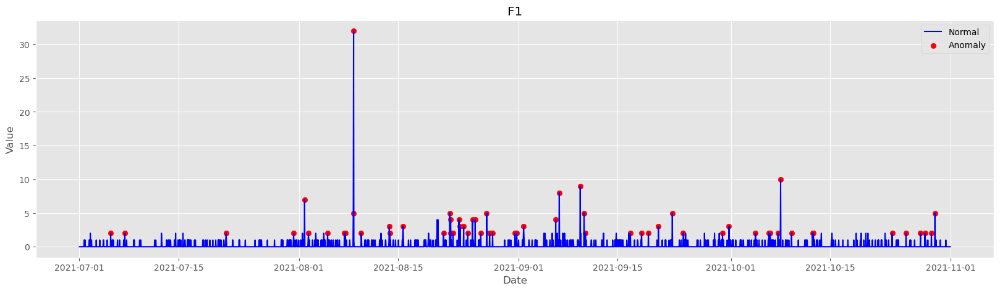

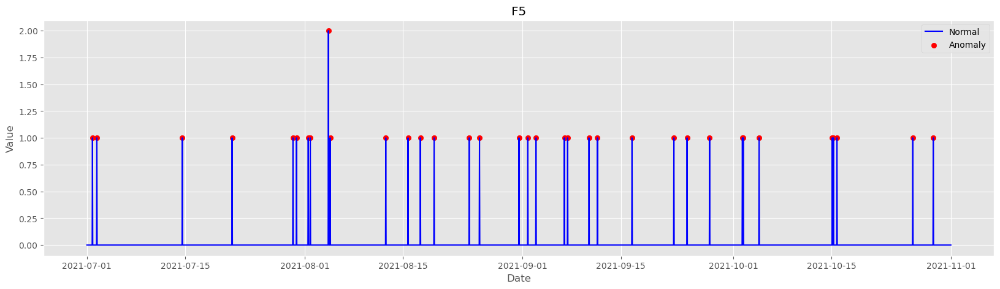

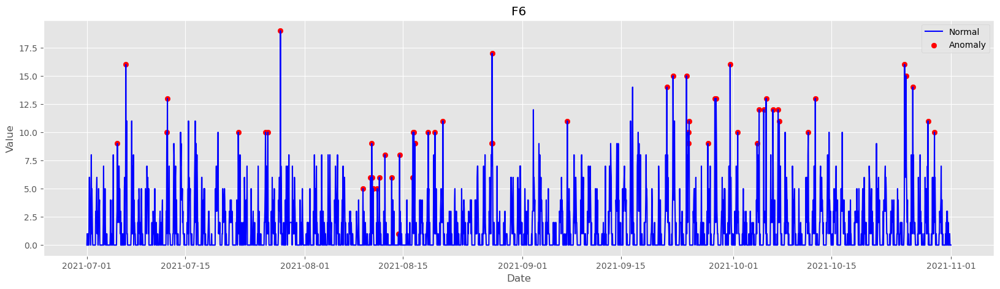

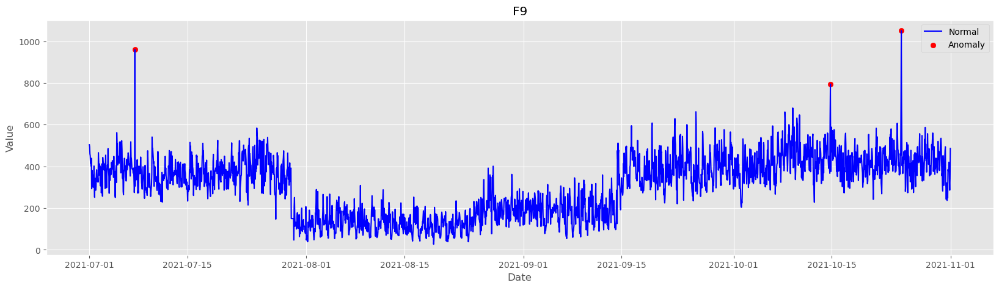

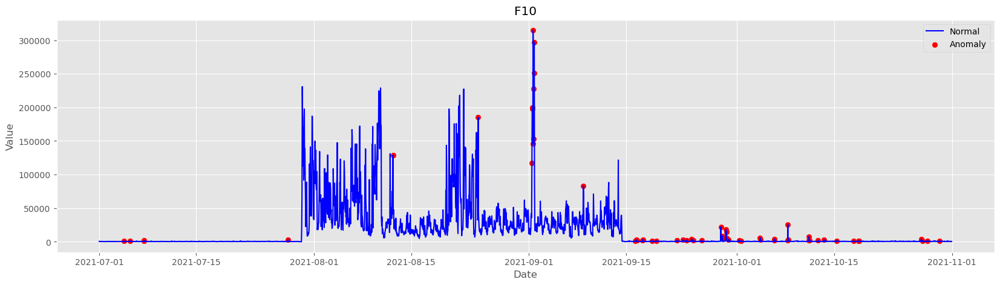

...

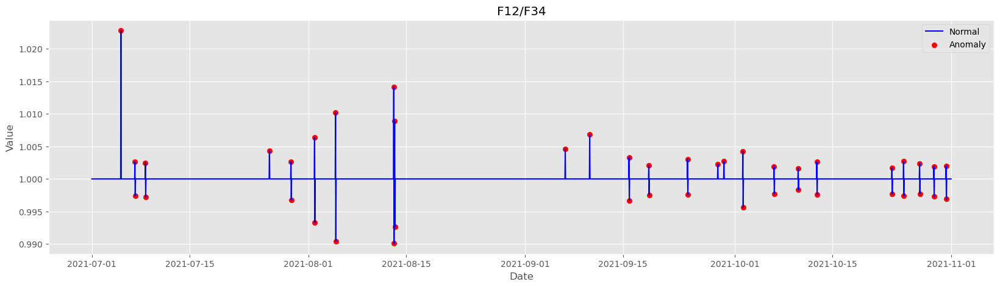

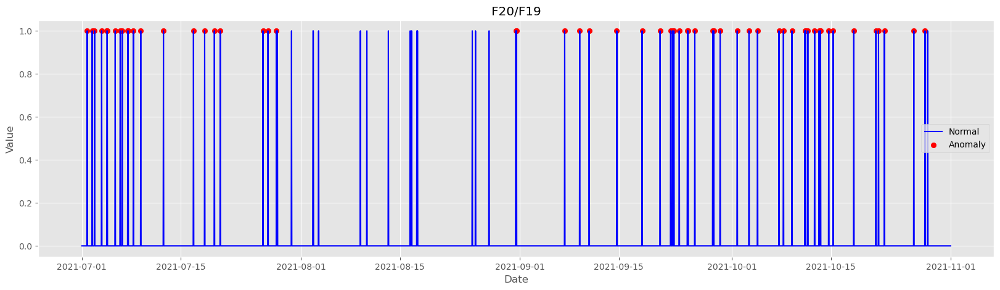

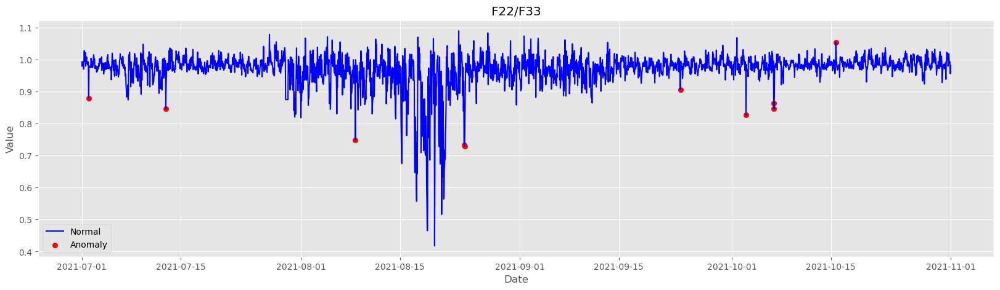

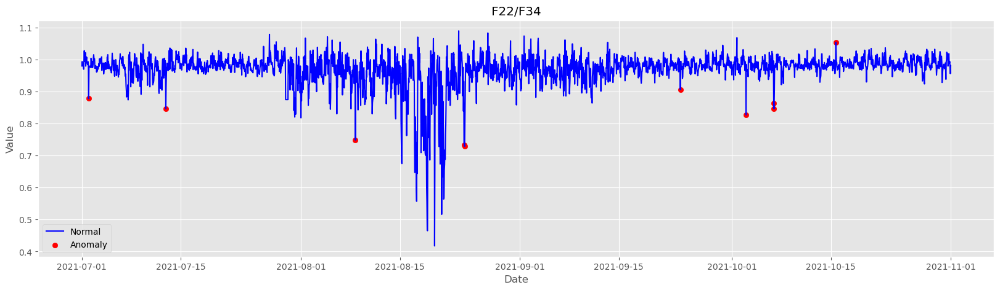

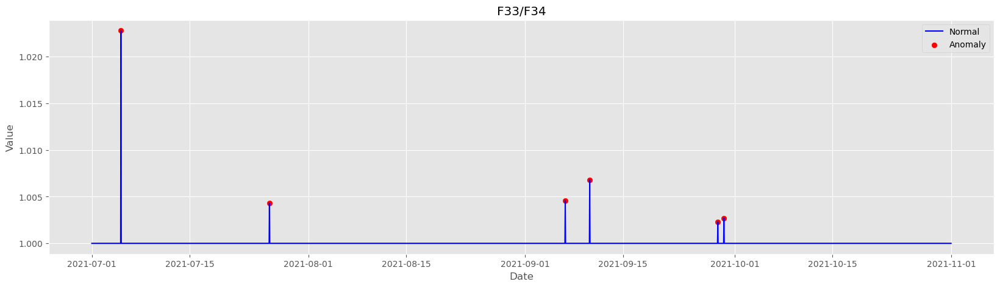

In [10]:
#With window_size = 96
window_size = 96  # size of moving window

for col in df.columns:
    # calculate rolling IQR
    q1 = df[col].rolling(window_size,center =True,min_periods=1).apply(lambda x: pd.Series(x).quantile(0.25))
    q3 = df[col].rolling(window_size,center =True,min_periods=1).apply(lambda x: pd.Series(x).quantile(0.75))
    iqr = q3 - q1
    #df.rolling(window=3, center=False).apply(lambda x: pd.Series(x).quantile(0.75))
    
    # calculate upper and lower bounds based on the rolling IQR
    lower_bound = (q1 - 3 * iqr)
    upper_bound = (q3 + 3 * iqr)
    
    
    # find anomalies
    anomalies = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    
    top_n = int(np.ceil(len(df) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by=col, ascending = False).head(top_n)
    
    
    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(df.index, df[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    
    #saving plots
    #col_name = col.replace("/", " divided by ")
    #plt.savefig(col_name + '_rolling_iqr_plot.png')
    
    plt.show()

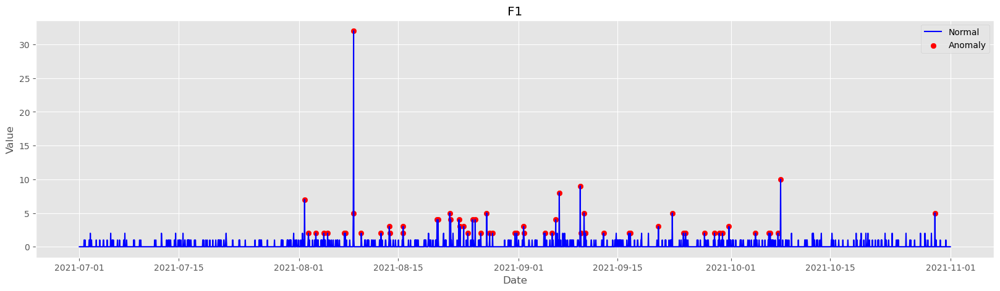

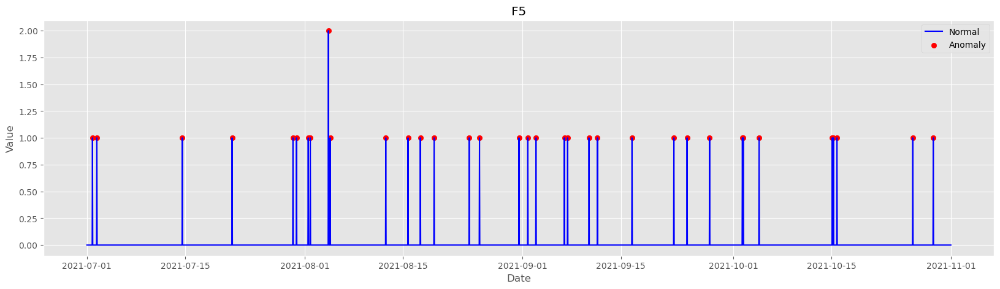

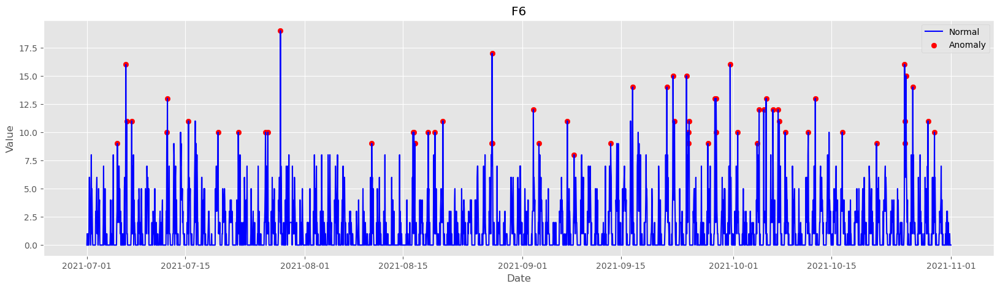

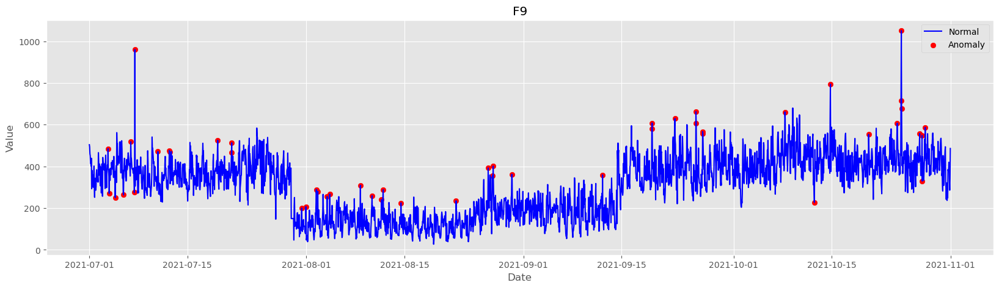

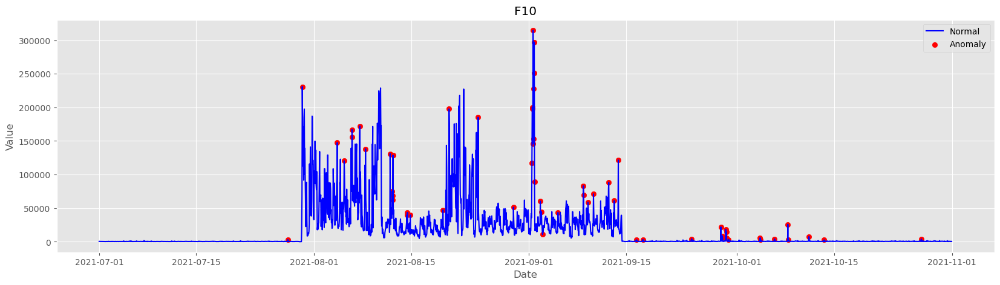

...

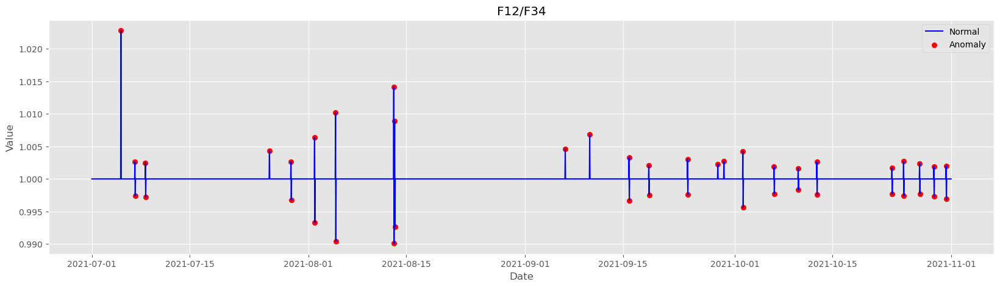

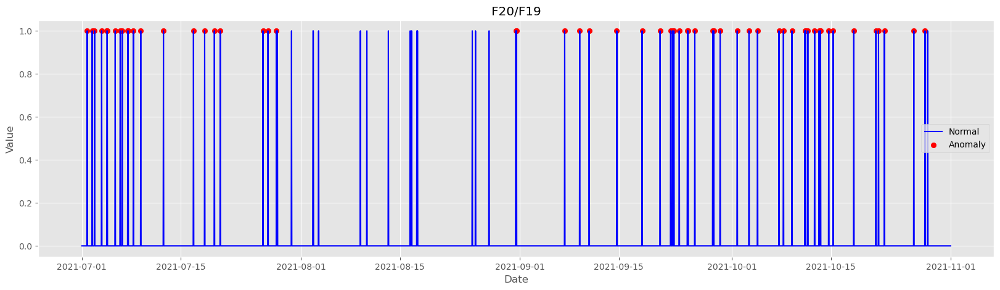

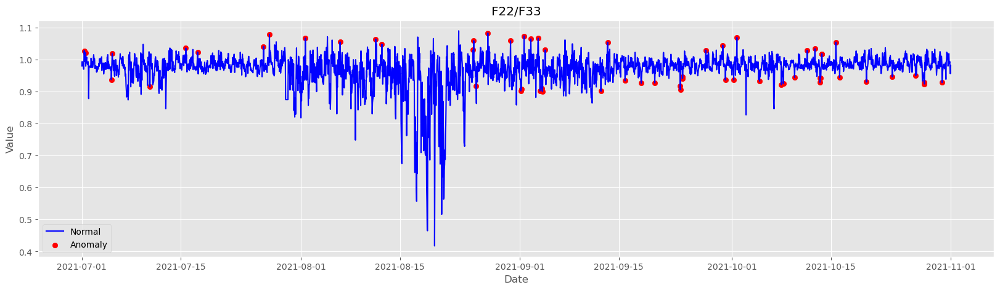

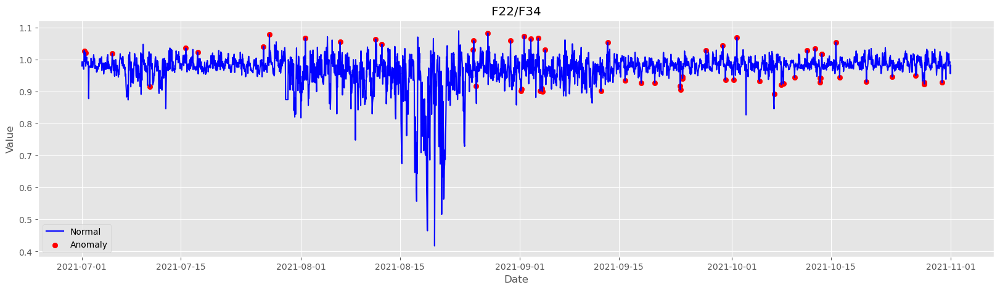

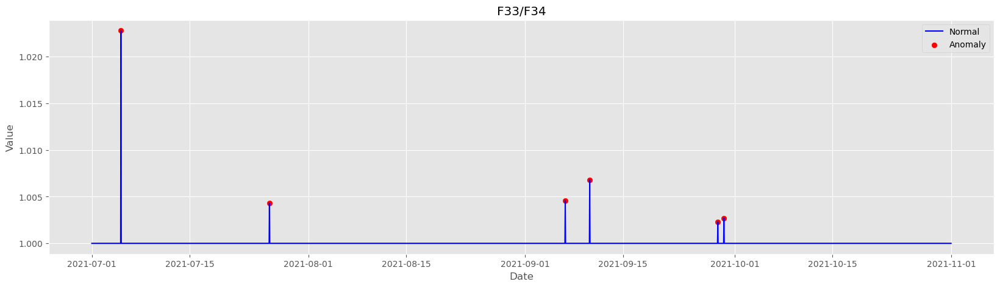

In [9]:
#With window_size = 48
window_size = 48  # size of moving window

for col in df.columns:
    # calculate rolling IQR
    q1 = df[col].rolling(window_size,center =True,min_periods=1).quantile(0.25)
    q3 = df[col].rolling(window_size,center =True,min_periods=1).quantile(0.75)
    iqr = q3 - q1
    
    
    # calculate upper and lower bounds based on the rolling IQR
    lower_bound = (q1 - 1.5 * iqr).round(4)
    upper_bound = (q3 + 1.5 * iqr).round(4)
    
    
    # find anomalies
    anomalies = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    
    top_n = int(np.ceil(len(df) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by=col, ascending = False).head(top_n)
    
    
    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(df.index, df[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    
    #saving plots
    #col_name = col.replace("/", " divided by ")
    #plt.savefig(col_name + '_rolling_iqr_plot.png')
    
    plt.show()

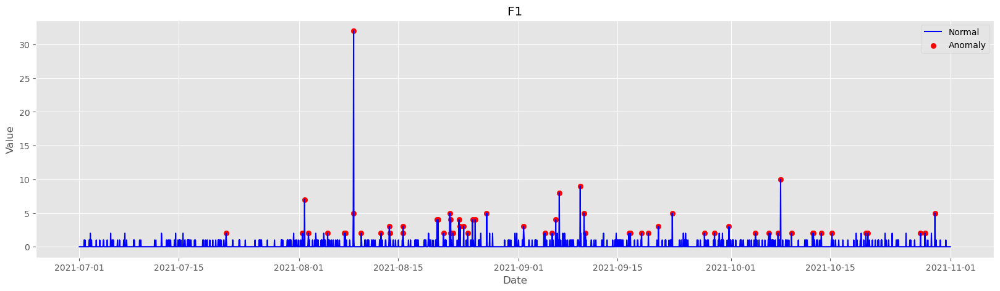

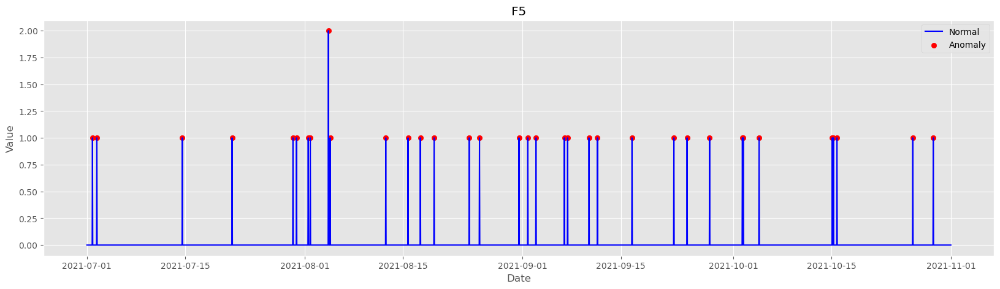

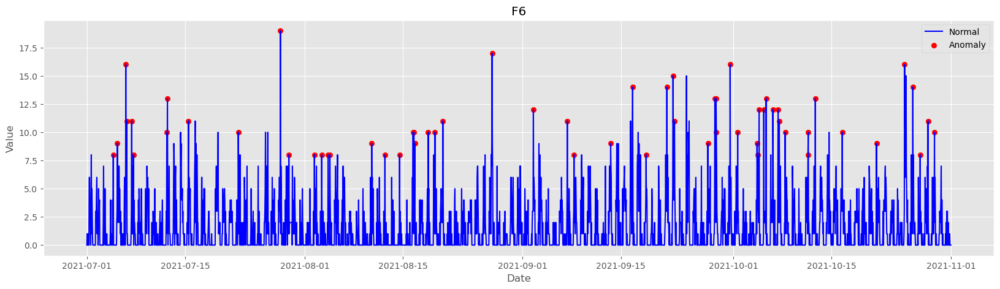

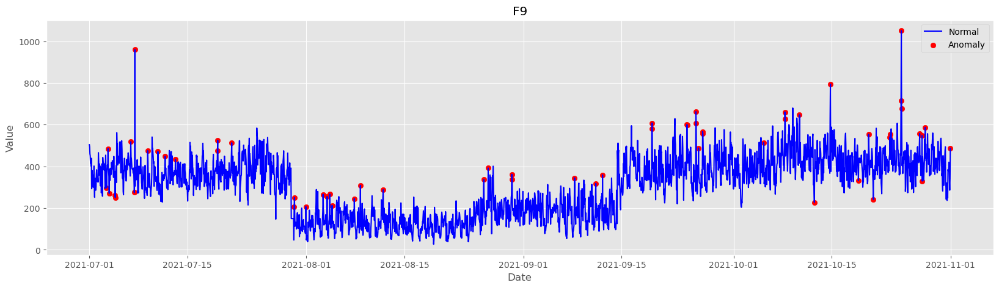

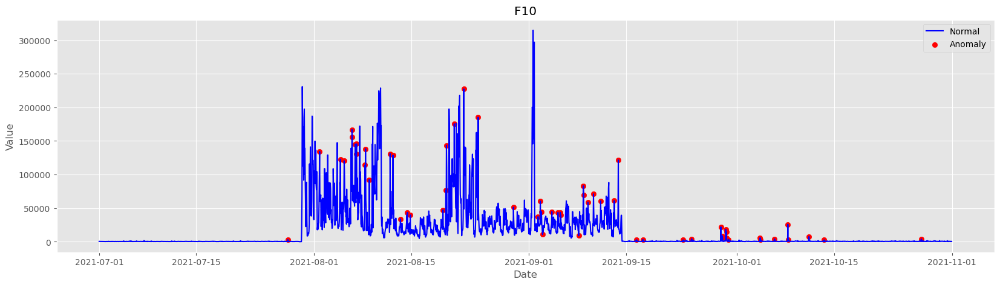

...

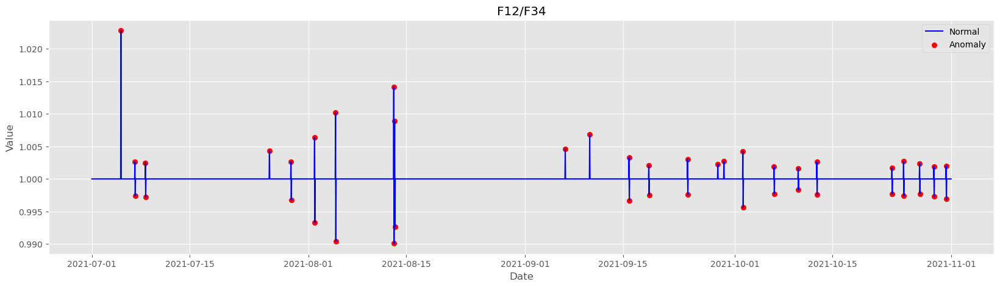

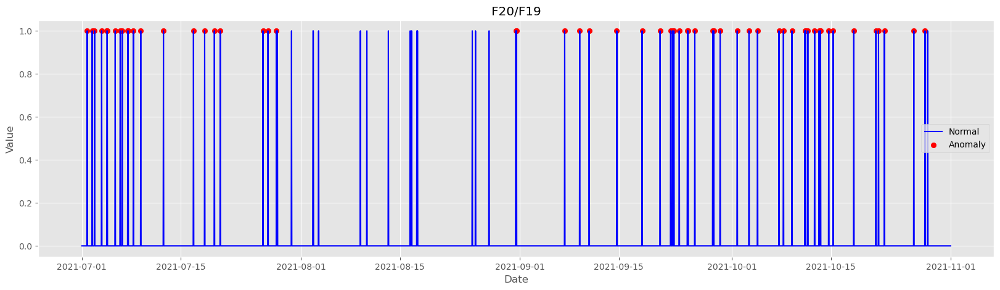

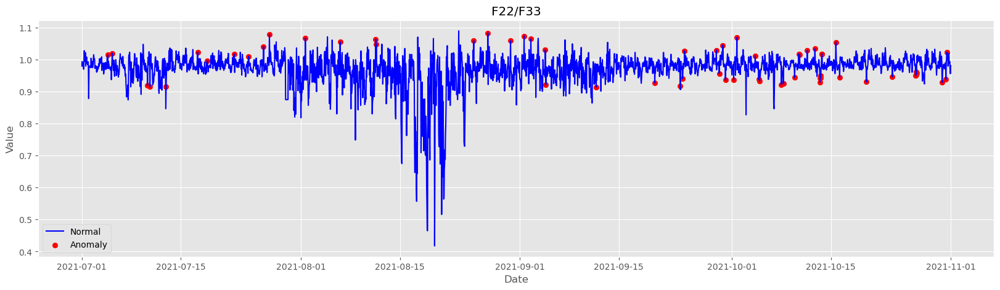

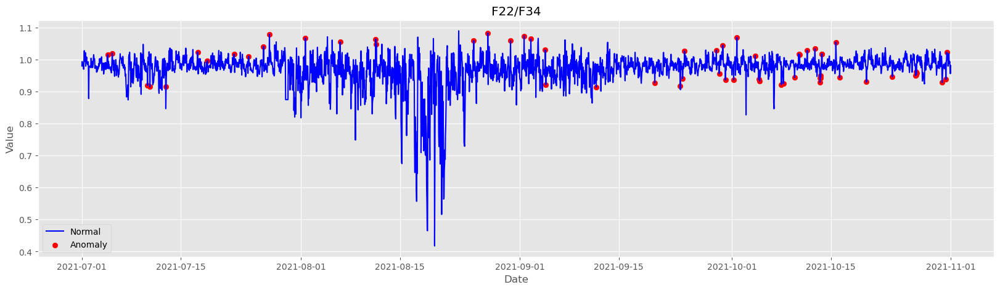

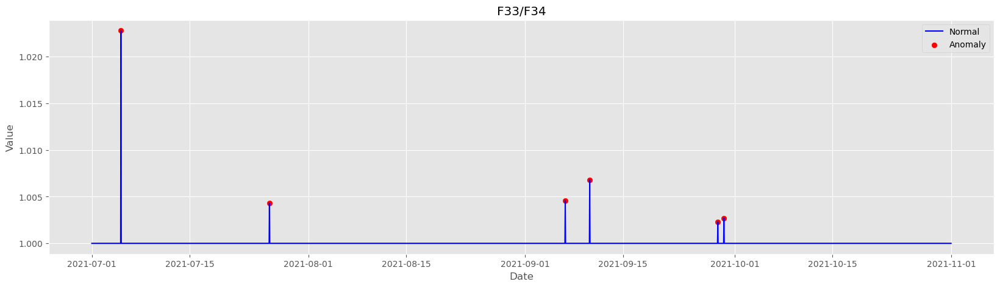

In [8]:
#With window_size = 24
window_size = 24  # size of moving window

for col in df.columns:
    # calculate rolling IQR
    q1 = df[col].rolling(window_size,center=True,min_periods=1).quantile(0.25)
    q3 = df[col].rolling(window_size,center=True,min_periods=1).quantile(0.75)
    iqr = q3 - q1
    
    
    # calculate upper and lower bounds based on the rolling IQR
    lower_bound = (q1 - 1.5 * iqr).round(4)
    upper_bound = (q3 + 1.5 * iqr).round(4)
    
    
    # find anomalies
    anomalies = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    
    top_n = int(np.ceil(len(df) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by=col, ascending = False).head(top_n)
    
    
    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(df.index, df[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, top_n_outliers[col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    
    #saving plots
    #col_name = col.replace("/", " divided by ")
    #plt.savefig(col_name + '_rolling_iqr_plot.png')
    
    plt.show()

In [166]:
data=pd.read_csv('C://Users//Admin//OneDrive//Desktop//HPE//data.csv')

In [167]:
data['timestamp'] = pd.to_datetime(data['timestamp'])
data.set_index('timestamp', inplace=True)

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import t
from statsmodels.tsa.seasonal import STL
import pandas as pd
from matplotlib import style

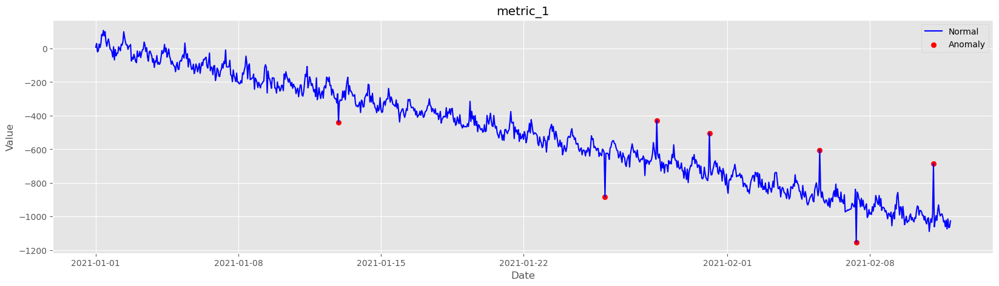

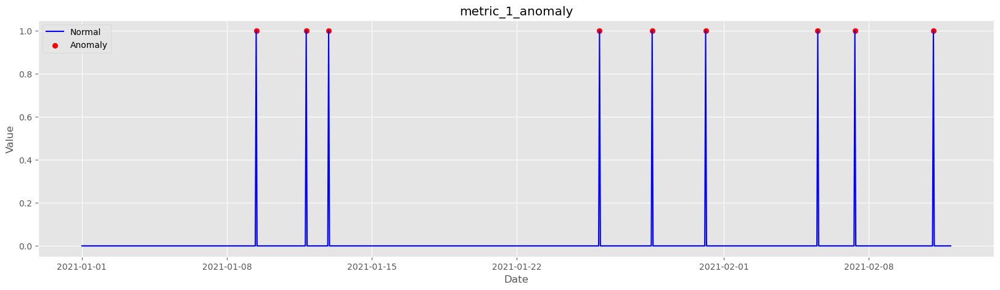

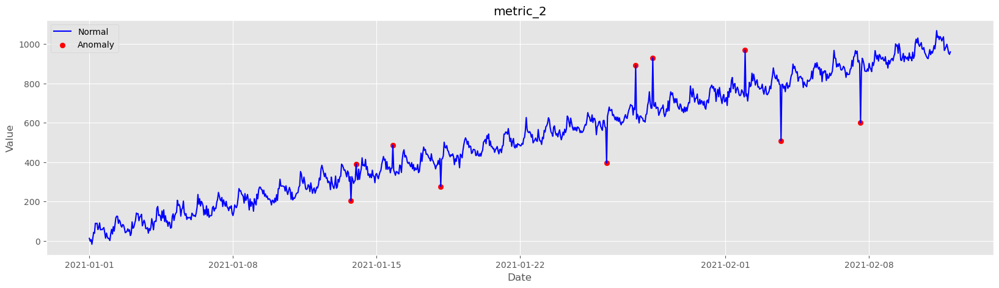

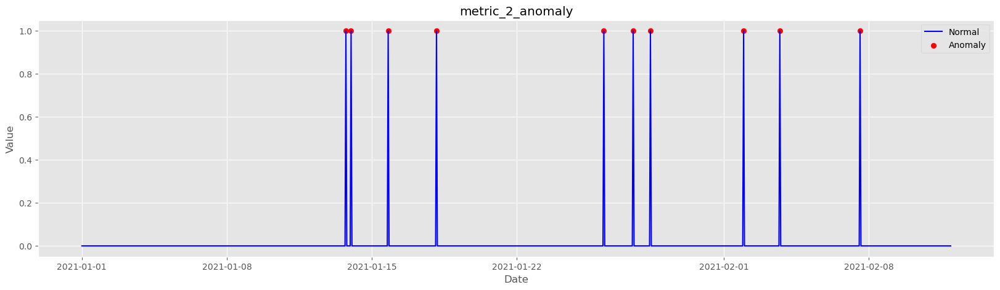

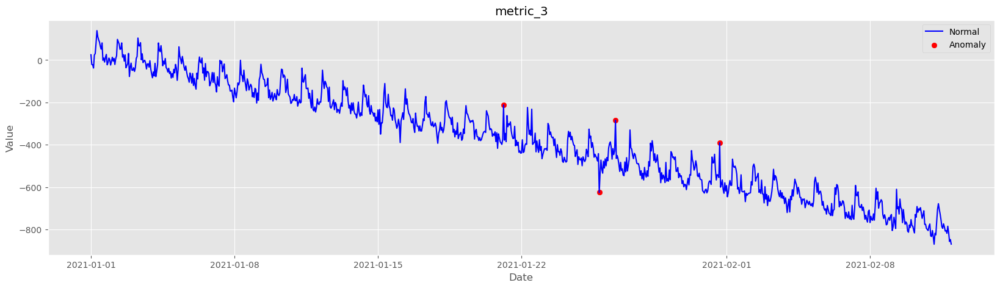

...

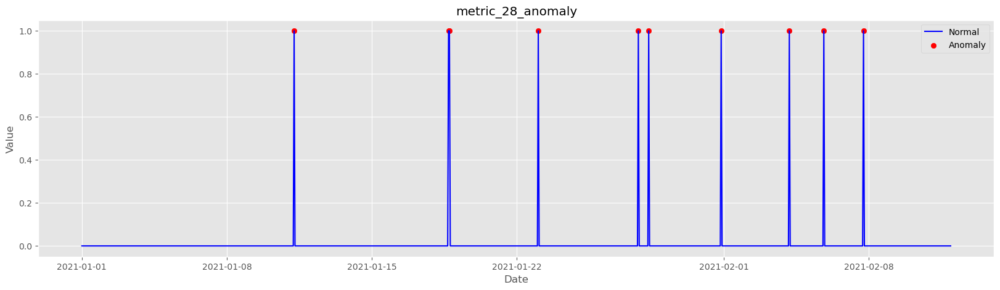

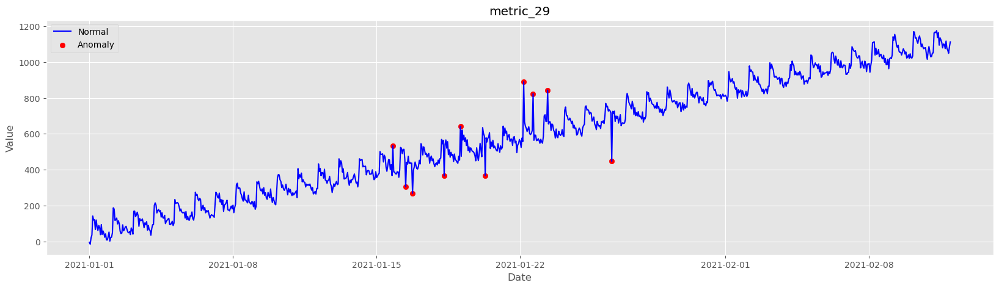

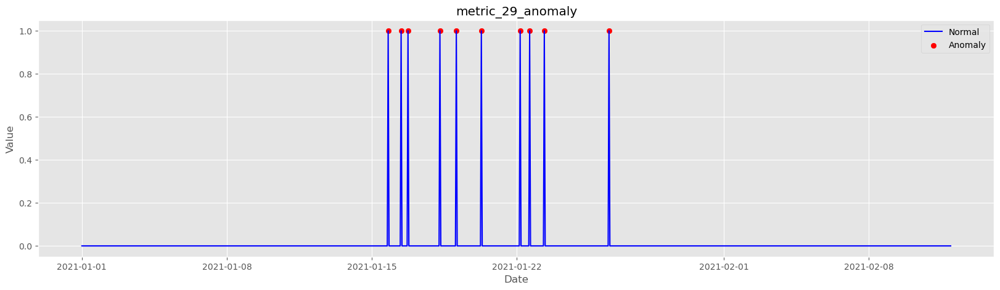

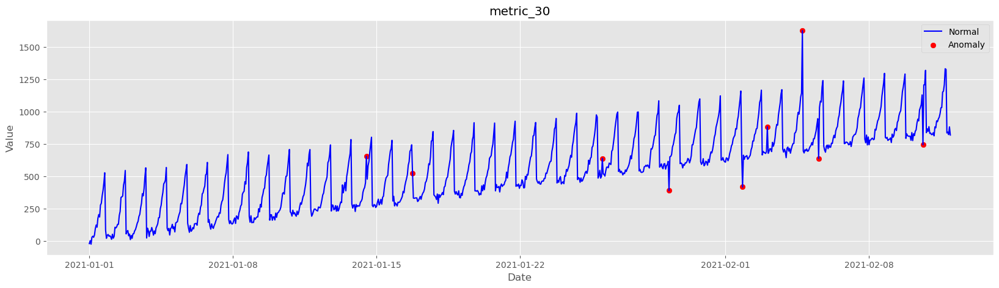

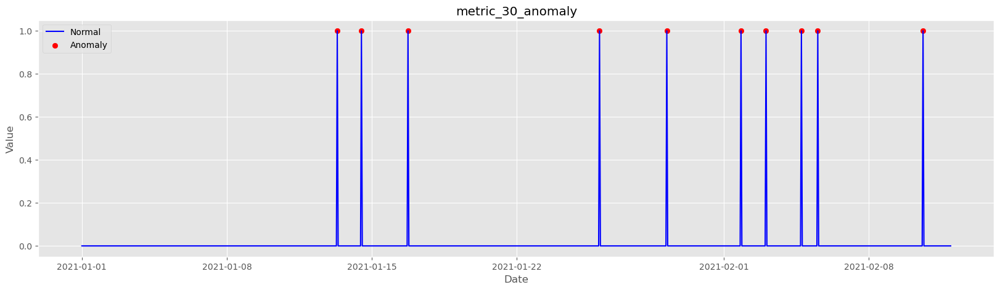

In [188]:
import statsmodels.api as sm

window_size = 84# size of moving window

for col in data.columns:
   if col!= "timestamp":
    # apply STL decomposition
    res = sm.tsa.seasonal_decompose(data[col], model='additive', period=24)
    residuals = pd.DataFrame({'residuals': res.resid}, index=data.index)
    
    residuals.round(2)
    # calculate rolling IQR
    q1 = residuals['residuals'].rolling(window_size, center=True, min_periods=1).quantile(0.25)
    q3 = residuals['residuals'].rolling(window_size, center=True,min_periods=1).quantile(0.75)
    iqr = q3 - q1
    
    # calculate upper and lower bounds based on the rolling IQR
    lower_bound = (q1 - 3 * iqr)
    upper_bound = (q3 + 3 * iqr)
    
    #print(lower_bound)
    #print(upper_bound)
    # find anomalies
    anomalies = residuals[(residuals['residuals'] < lower_bound) | (residuals['residuals'] > upper_bound)]
    top_n = int(np.ceil(len(data) * 2 / 100))
    top_n_outliers = anomalies.sort_values(by='residuals', ascending=False).head(top_n)
    #print(top_n_outliers.index)
    # plot results
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(data.index, data[col], color='blue', label='Normal')
    ax.scatter(top_n_outliers.index, data.loc[top_n_outliers.index, col], color='red', label='Anomaly')
    plt.title(col)
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    
    #saving plots
    #col_name = col.replace("/", " divided by ")
    #plt.savefig(col_name + '_rolling_iqr_plot.png')
    
    plt.show()
